In [6]:
import csv
import numpy as np

# Function to generate arrays with appended profession
def generate_arrays_with_profession(input_array, profession, n):
    # Define the ranges for low, mid, and high
    low_range = (1, 4)
    mid_range = (4, 7)
    high_range = (7, 10)

    # To store all generated arrays
    all_new_arrays = []

    for _ in range(n):
        new_array = []
        for value in input_array:
            if low_range[0] <= value <= low_range[1]:
                # Generate value in the low range
                new_value = round(np.random.uniform(low_range[0], low_range[1]), 2)
            elif mid_range[0] < value <= mid_range[1]:
                # Generate value in the mid range
                new_value = round(np.random.uniform(mid_range[0], mid_range[1]), 2)
            elif high_range[0] < value <= high_range[1]:
                # Generate value in the high range
                new_value = round(np.random.uniform(high_range[0], high_range[1]), 2)
            else:
                new_value = value  # This case should not occur based on input constraints
            new_array.append(new_value)
        new_array.append(profession)  # Append the profession
        all_new_arrays.append(new_array)

    return all_new_arrays

# File paths
input_file_path = 'Data_final.csv'  # Change this to the correct path of your input file
output_file_path = 'Data2.csv'

# Read the input CSV and generate new arrays
with open(input_file_path, mode='r') as input_file:
    csv_reader = csv.reader(input_file)
    header = next(csv_reader)  # Skip the header row

    generated_data = []

    for row in csv_reader:
        input_array = list(map(float, row[:-1]))  # Convert the first 10 values to floats
        profession = row[-1]  # The last value is the profession
        n = 1000  # Number of new arrays to generate
        generated_rows = generate_arrays_with_profession(input_array, profession, n)
        generated_data.extend(generated_rows)

# Save the new generated data into a CSV file
with open(output_file_path, mode='w', newline='') as output_file:
    csv_writer = csv.writer(output_file)
    # Write header row
    csv_writer.writerow([f"Feature {i+1}" for i in range(len(generated_data[0])-1)] + ["Profession"])
    # Write the generated data
    csv_writer.writerows(generated_data)

print(f"New arrays saved to {output_file_path}")



New arrays saved to Data2.csv


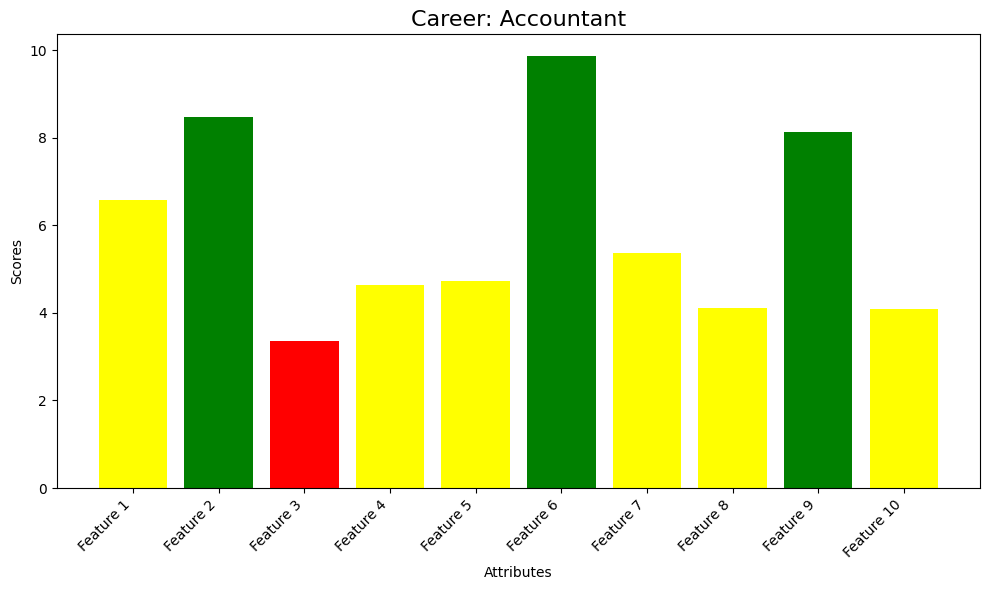

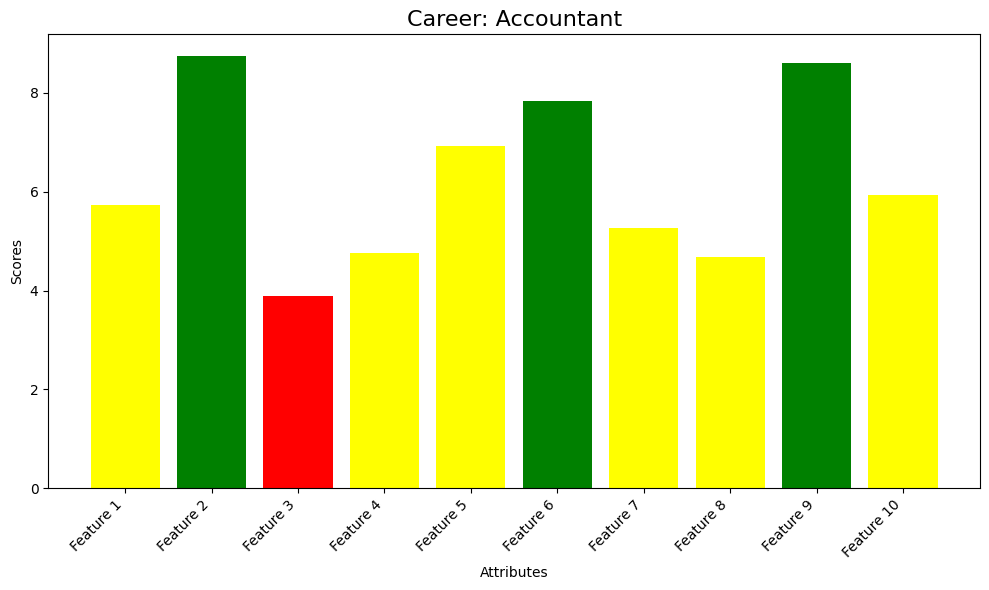

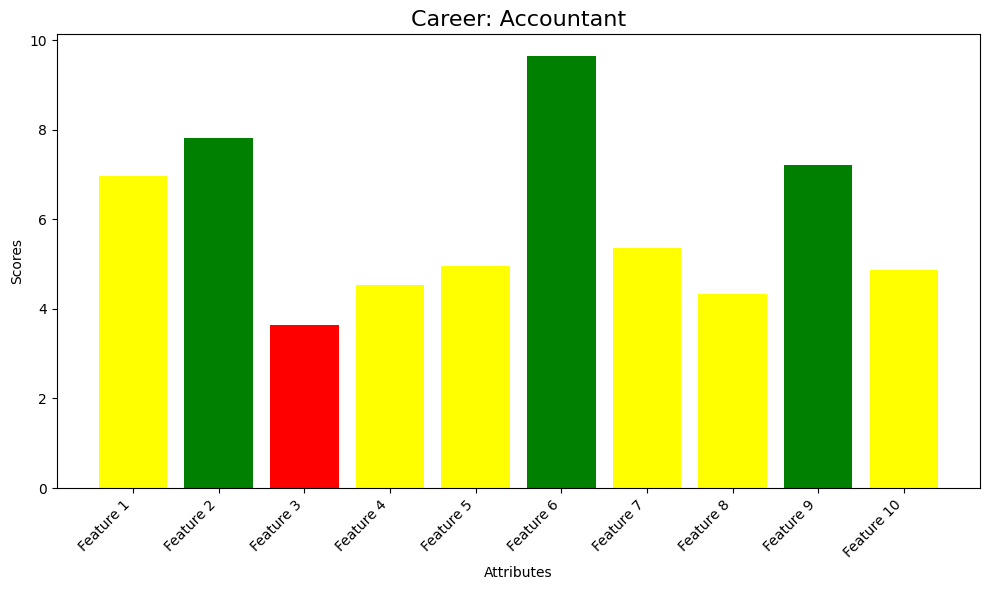

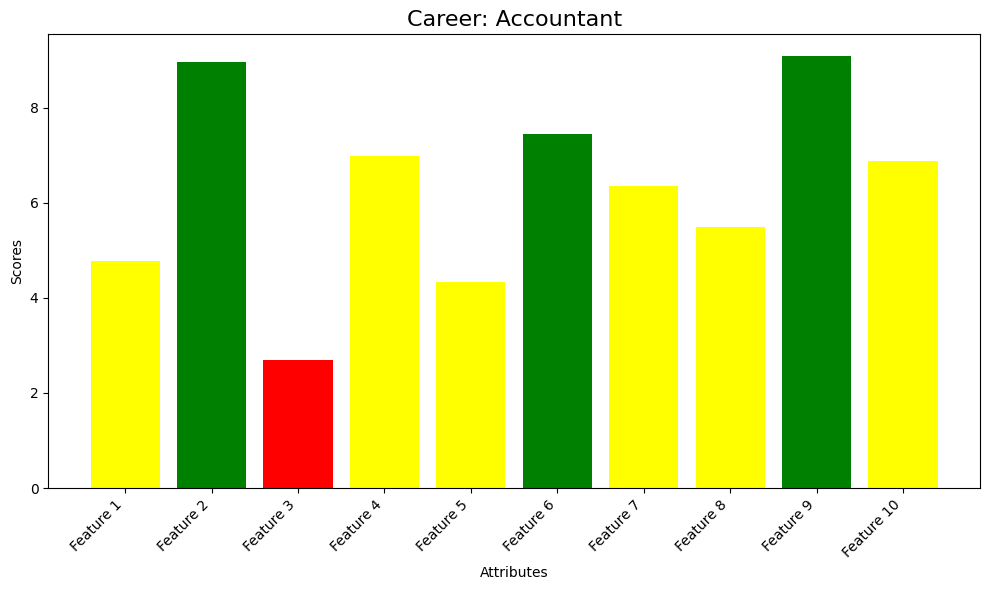

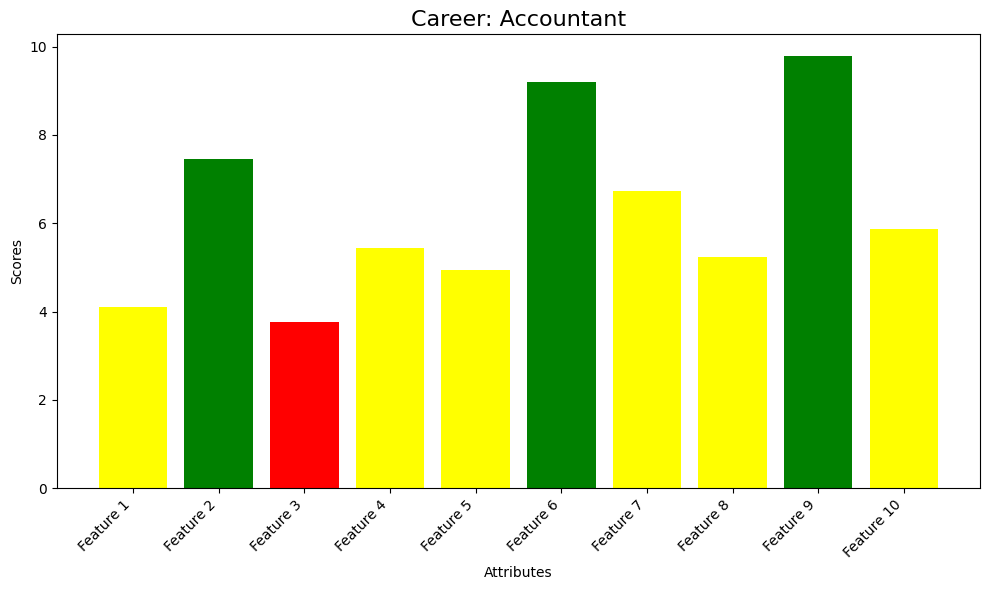

...

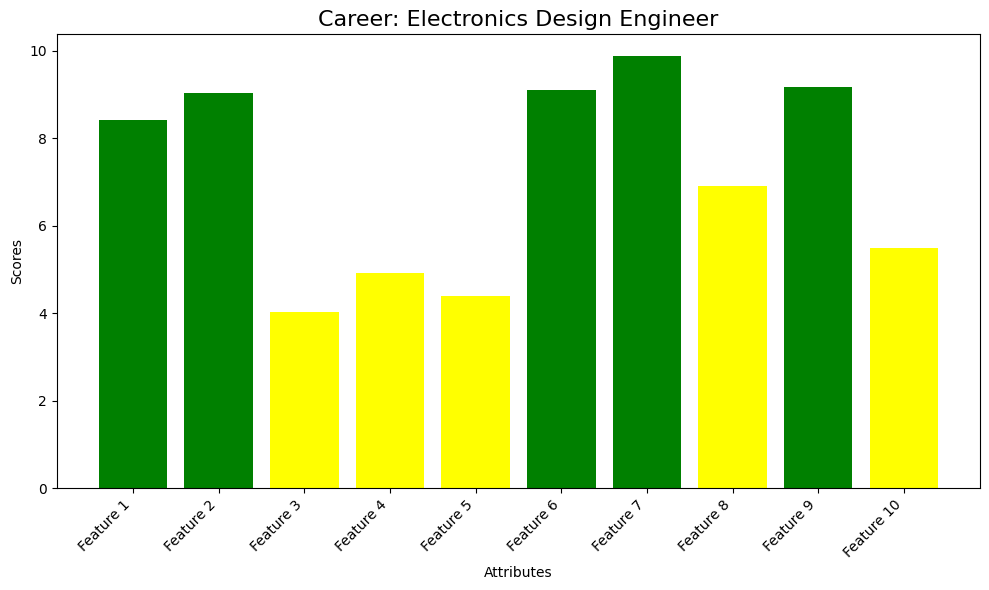

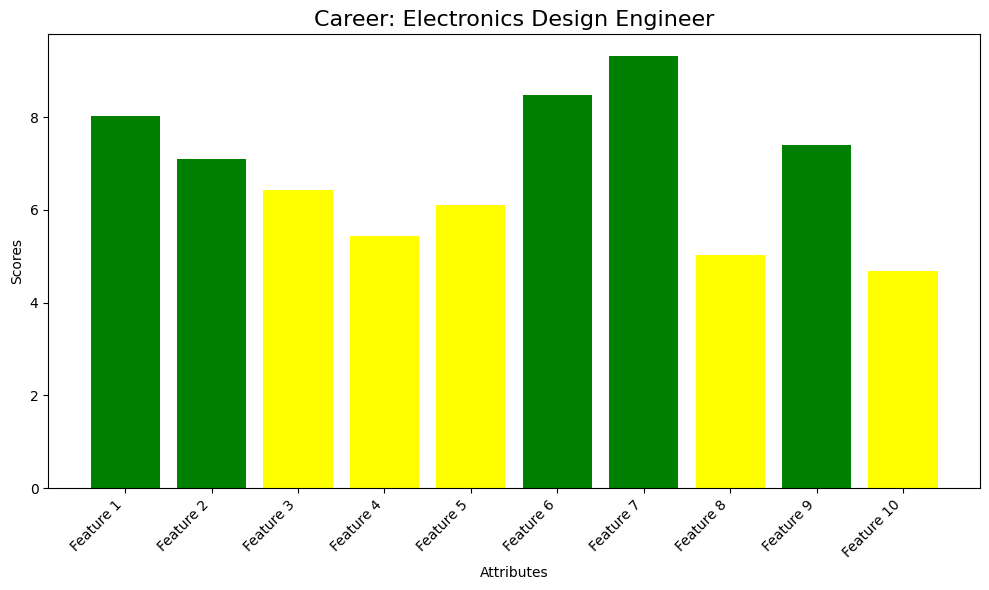

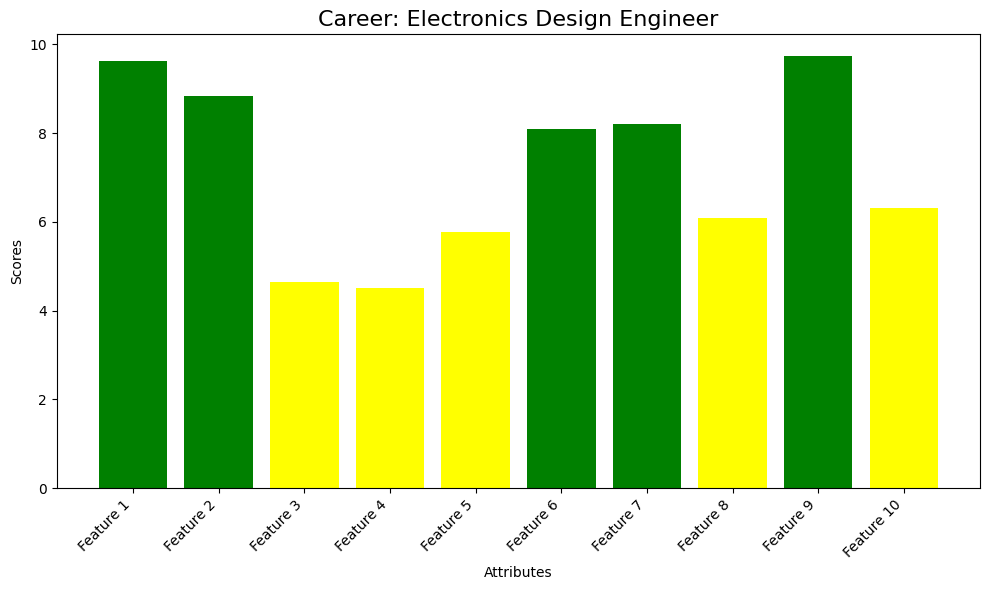

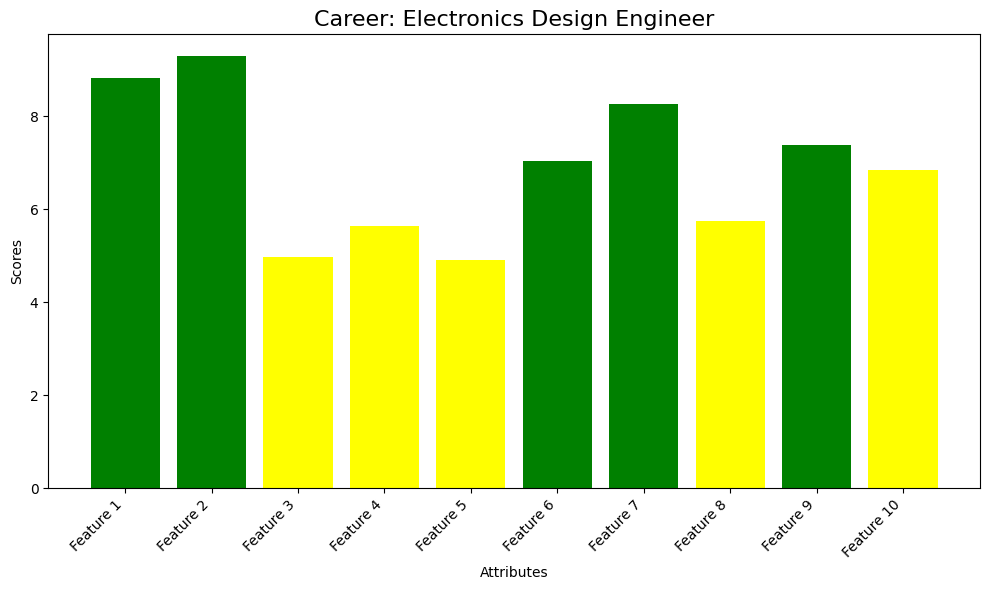

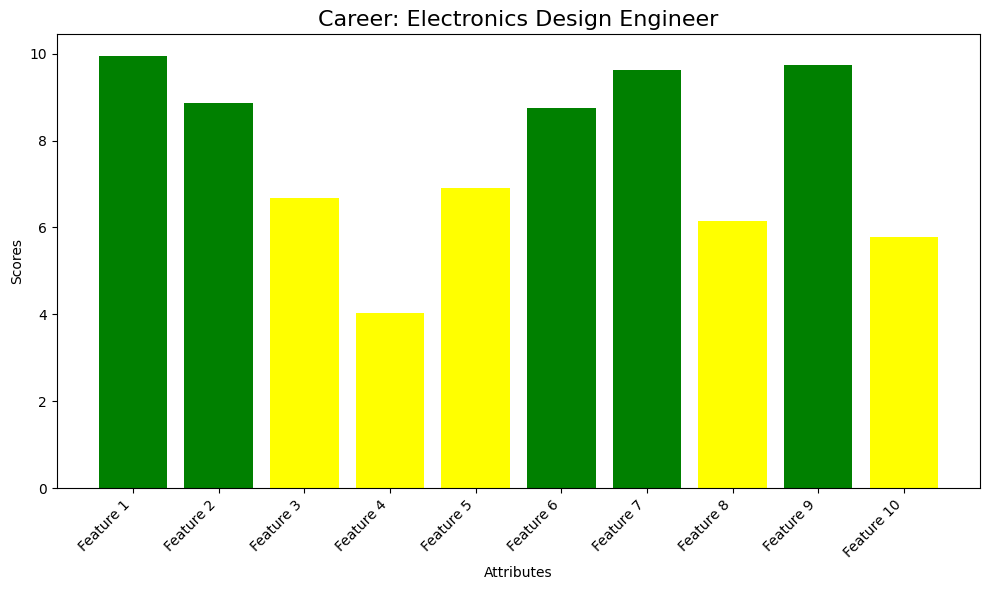

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Function to create a visual representation for a given row with custom colors
def visualize_row(row_data):
    plt.figure(figsize=(10, 6))
    
    # Extracting the data to plot
    scores = row_data.iloc[:-1]  # Exclude the 'Career' column
    career = row_data.iloc[-1]
    
    # Determine colors based on the value
    colors = []
    for score in scores:
        if 1 < score <= 4:
            colors.append('red')
        elif 4 < score <= 7:
            colors.append('yellow')
        elif 7 < score <= 10:
            colors.append('green')
    
    # Create a barplot with the specified colors
    plt.bar(x=scores.index, height=scores.values, color=colors)
    
    # Customize the plot
    plt.title(f'Career: {career}', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Scores')
    plt.xlabel('Attributes')
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Load the CSV file into a DataFrame
data = pd.read_csv('Generated_Data.csv')

# Visualize each row in the DataFrame
for index, row in data.iterrows():
    visualize_row(row)
